In [1]:
%cd ../

/home/eli/AnacondaProjects/HTFATorch


In [2]:
import logging
import numpy as np
import re

import htfa_torch.htfa as HTFA
import htfa_torch.niidb as niidb
import htfa_torch.utils as utils

/home/eli/anaconda3/envs/HTFATorch/lib/python3.7/site-packages/sklearn/externals/joblib/__init__.py:15: DeprecationWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=DeprecationWarning)


In [3]:
%matplotlib inline

In [4]:
logging.basicConfig(format='%(asctime)s %(message)s', datefmt='%m/%d/%Y %H:%M:%S',
                    level=logging.INFO)

In [5]:
lepping_db = niidb.FMriActivationsDb('data/sound_depression.db', mask='/home/eli/Documents/sound_depression/ds000171-download/all_tasks/wholebrain.nii.gz')

In [6]:
htfa = HTFA.HierarchicalTopographicFactorAnalysis([b for b in lepping_db.all() if b.task not in ['response', 'tones']], mask='/home/eli/Documents/sound_depression/ds000171-download/all_tasks/wholebrain.nii.gz', num_factors=100)

01/31/2020 11:50:57 Loading Nifti image /home/eli/Documents/sound_depression/nifti_files/sub-control01_run3_music_mc_MNI_masked.nii.gz with mask /home/eli/Documents/sound_depression/ds000171-download/all_tasks/wholebrain.nii.gz (zscore=True, smooth=6, zscore_by_rest=True)
01/31/2020 11:51:00 Loading Nifti image /home/eli/Documents/sound_depression/nifti_files/sub-control01_run2_music_mc_MNI_masked.nii.gz with mask /home/eli/Documents/sound_depression/ds000171-download/all_tasks/wholebrain.nii.gz (zscore=True, smooth=6, zscore_by_rest=True)
01/31/2020 11:51:01 Loading Nifti image /home/eli/Documents/sound_depression/nifti_files/sub-control01_run4_nonmusic_mc_MNI_masked.nii.gz with mask /home/eli/Documents/sound_depression/ds000171-download/all_tasks/wholebrain.nii.gz (zscore=True, smooth=6, zscore_by_rest=True)
01/31/2020 11:51:03 Loading Nifti image /home/eli/Documents/sound_depression/nifti_files/sub-control01_run5_nonmusic_mc_MNI_masked.nii.gz with mask /home/eli/Documents/sound_depr

In [7]:
htfa.num_parameters()

1731200

In [9]:
htfa.load_state('data/lepping_noresponse_restz_k100_n1000_01302020_233405')

In [10]:
def subject_labeler(block):
    subject_regex = re.compile("([A-Za-z]+)([0-9]{1,2})")
    m = subject_regex.search(block.subject)
    condition, sub_num = m.groups()
    if condition == 'mdd':
        condition = 'Major Depressive'
    elif condition == 'control':
        condition = 'Control'
    return '%s Participant %d' % (condition, int(sub_num))

In [11]:
def task_labeler(block):
    if block.task == 'negative_music':
        task = 'Negative music'
    elif block.task == 'positive_music':
        task = 'Positive music'
    elif block.task == 'negative_nonmusic':
        task = 'Negative sounds'
    elif block.task == 'positive_nonmusic':
        task = 'Positive sounds'
    else:
        task = block.task.capitalize()
    return task

In [12]:
def lepping_2017_labeler(block):
    task = task_labeler(block)
    return task + ' stimulus'

In [13]:
validation_filter = lepping_db.inference_filter(training=False)
validation_blocks = [b for (b, block) in enumerate(htfa._blocks) if validation_filter(block)]

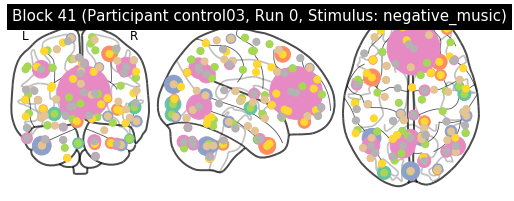

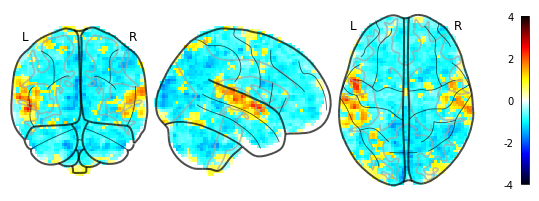

01/31/2020 11:58:44 Reconstruction Error (Frobenius Norm): 8.06951233e+02 out of 8.44604187e+02


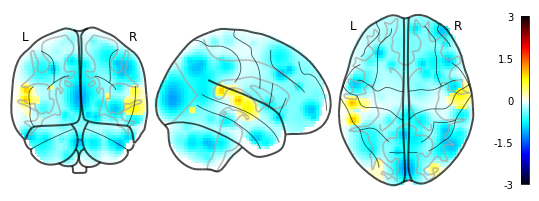

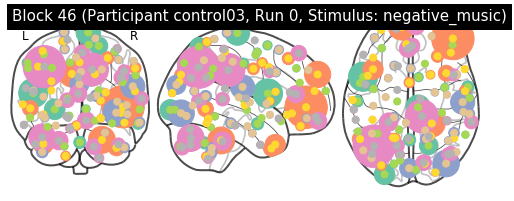

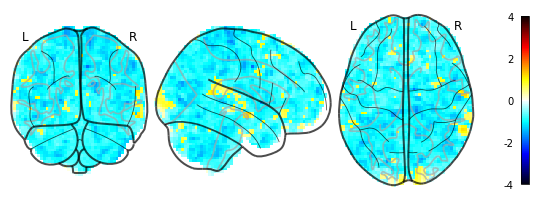

01/31/2020 11:58:47 Reconstruction Error (Frobenius Norm): 9.93088989e+02 out of 1.03223840e+03


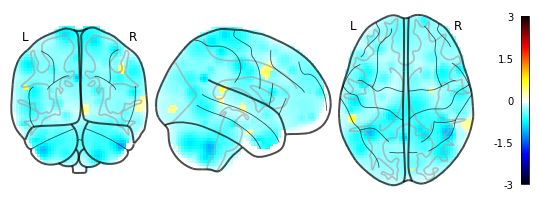

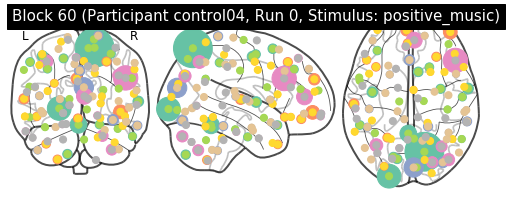

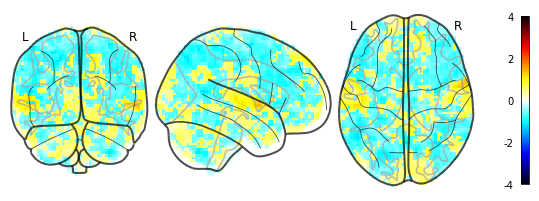

01/31/2020 11:58:51 Reconstruction Error (Frobenius Norm): 8.56159912e+02 out of 8.63454956e+02


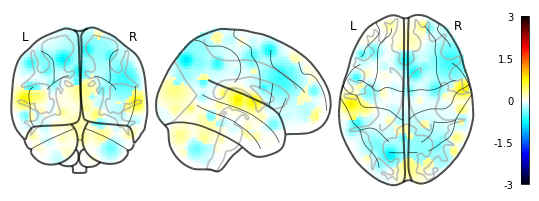

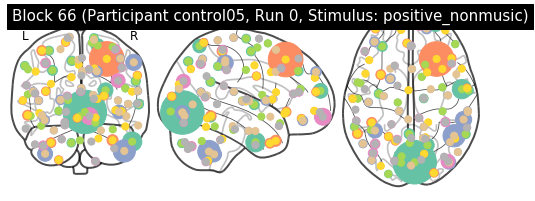

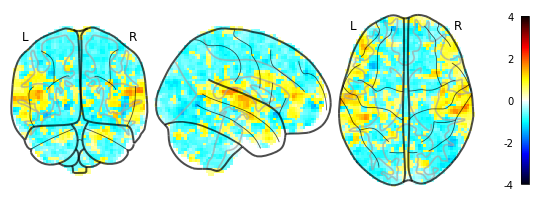

01/31/2020 11:58:55 Reconstruction Error (Frobenius Norm): 8.82653076e+02 out of 8.93795532e+02


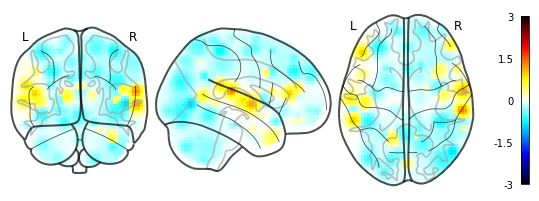

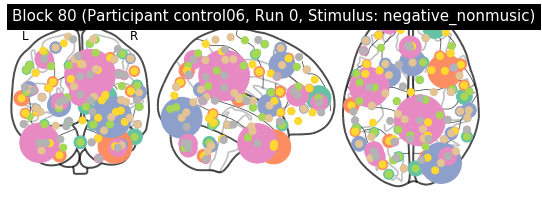

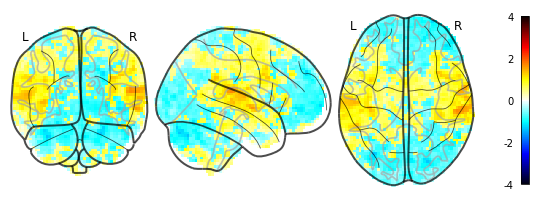

01/31/2020 11:58:59 Reconstruction Error (Frobenius Norm): 8.64333008e+02 out of 8.80790527e+02


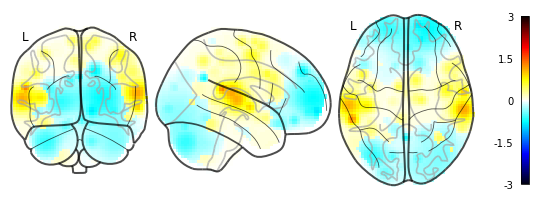

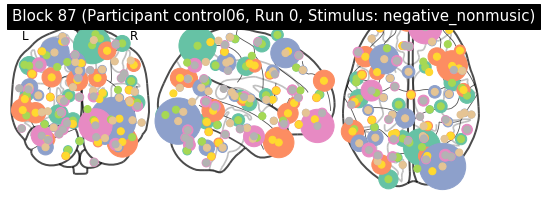

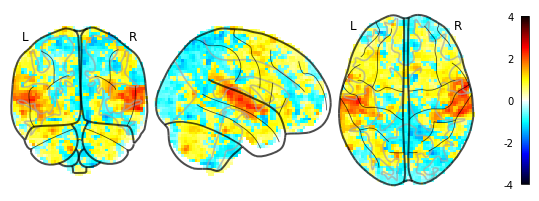

01/31/2020 11:59:03 Reconstruction Error (Frobenius Norm): 1.02402844e+03 out of 1.04409570e+03


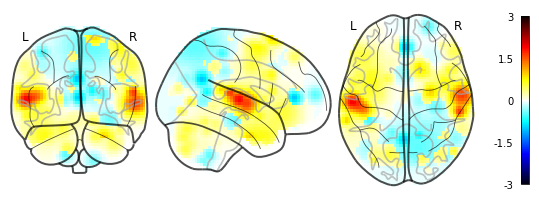

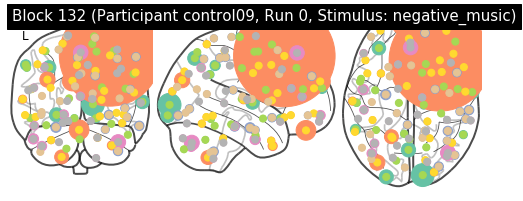

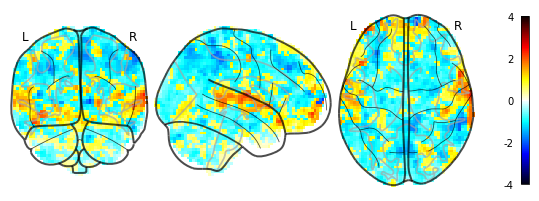

01/31/2020 11:59:07 Reconstruction Error (Frobenius Norm): 8.38534302e+02 out of 8.59400330e+02


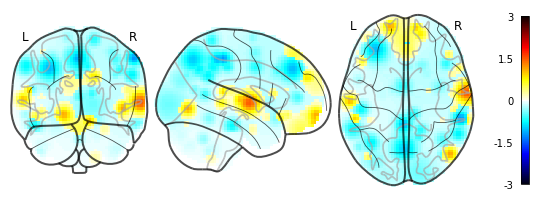

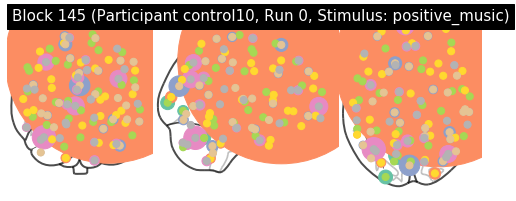

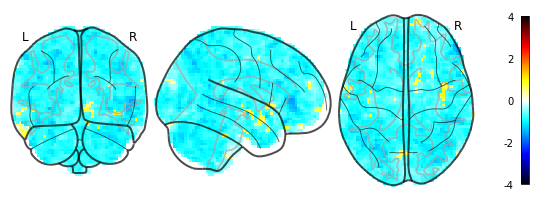

01/31/2020 11:59:11 Reconstruction Error (Frobenius Norm): 8.55522522e+02 out of 9.03192444e+02


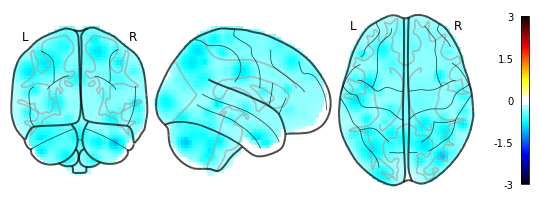

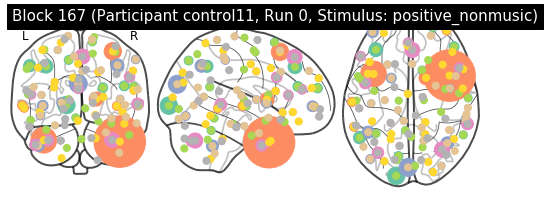

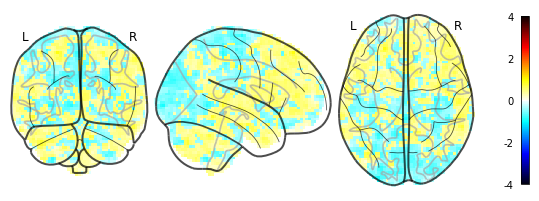

01/31/2020 11:59:15 Reconstruction Error (Frobenius Norm): 8.30521057e+02 out of 8.34299194e+02


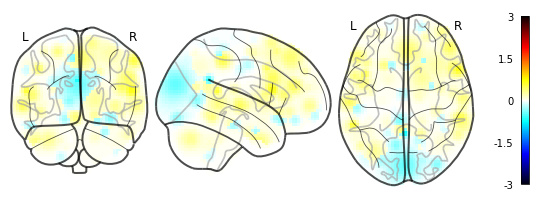

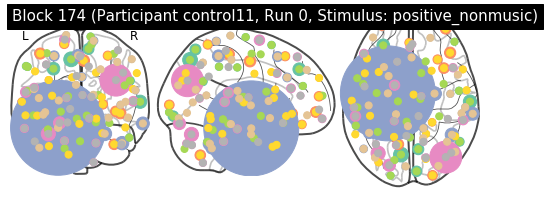

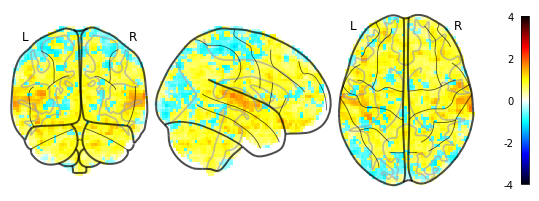

01/31/2020 11:59:18 Reconstruction Error (Frobenius Norm): 8.93393677e+02 out of 9.11033508e+02


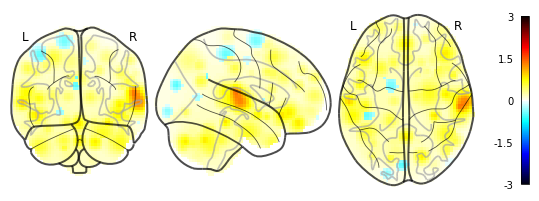

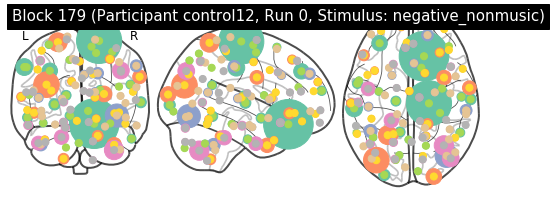

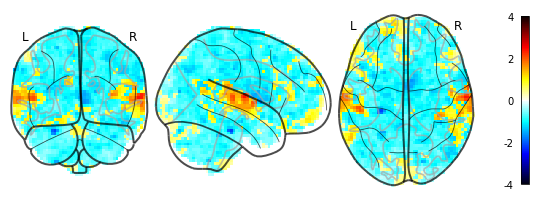

01/31/2020 11:59:22 Reconstruction Error (Frobenius Norm): 7.88914368e+02 out of 8.18766968e+02


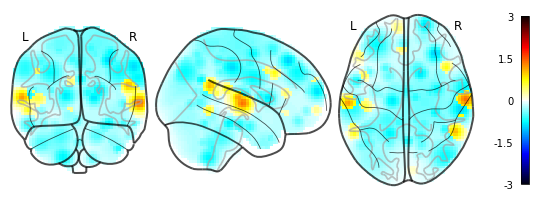

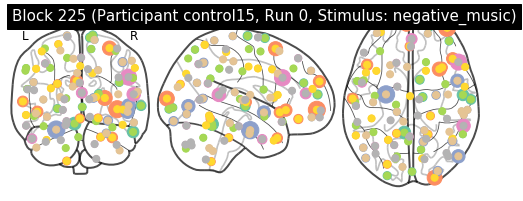

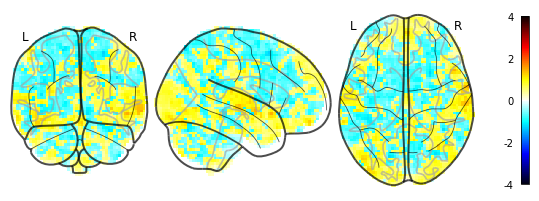

01/31/2020 11:59:26 Reconstruction Error (Frobenius Norm): 8.97938171e+02 out of 9.03035767e+02


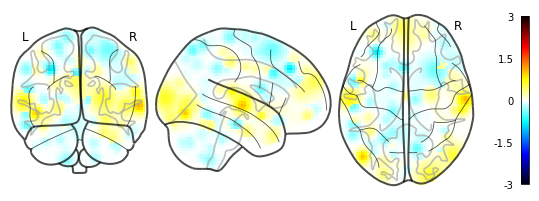

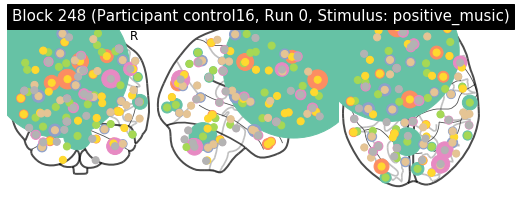

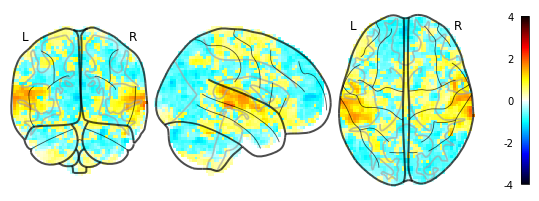

01/31/2020 11:59:30 Reconstruction Error (Frobenius Norm): 8.41769958e+02 out of 8.52762634e+02


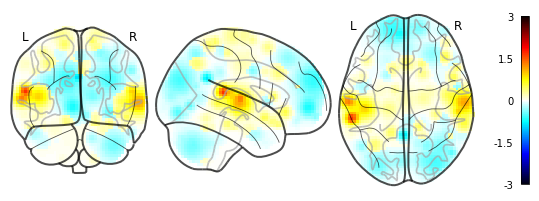

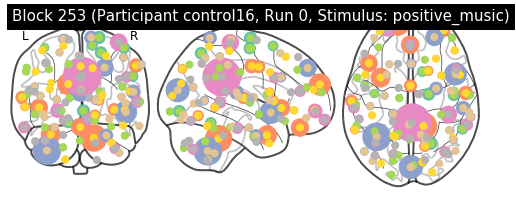

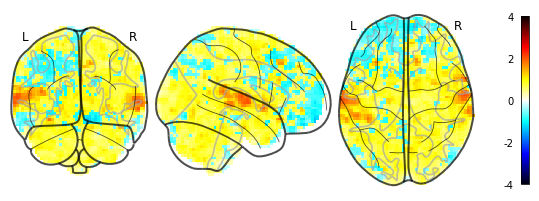

01/31/2020 11:59:34 Reconstruction Error (Frobenius Norm): 8.19190674e+02 out of 8.46491333e+02


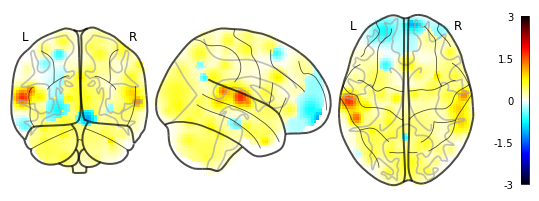

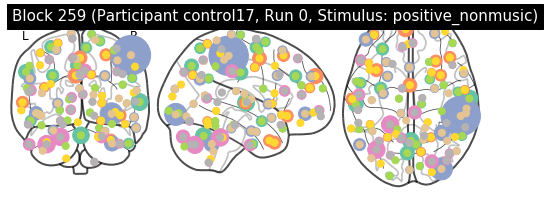

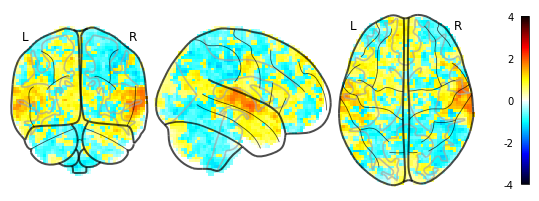

01/31/2020 11:59:38 Reconstruction Error (Frobenius Norm): 9.27668823e+02 out of 9.42982117e+02


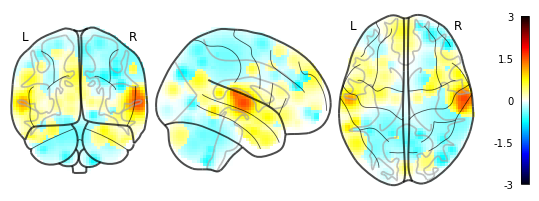

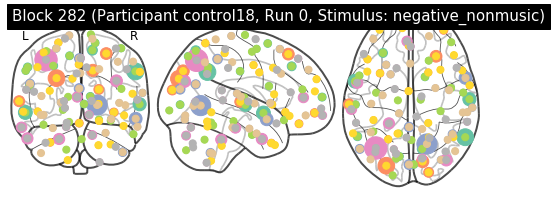

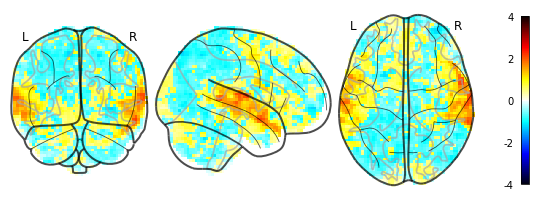

01/31/2020 11:59:42 Reconstruction Error (Frobenius Norm): 8.92694702e+02 out of 9.06209839e+02


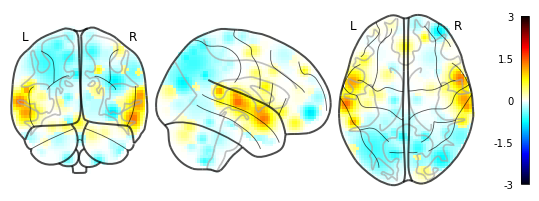

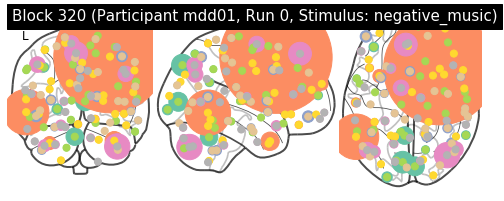

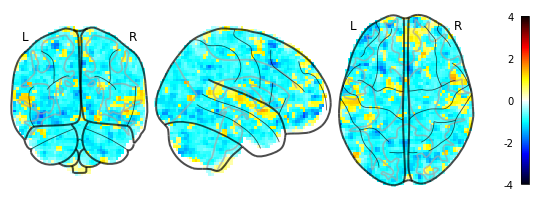

01/31/2020 11:59:46 Reconstruction Error (Frobenius Norm): 8.54997864e+02 out of 8.79910095e+02


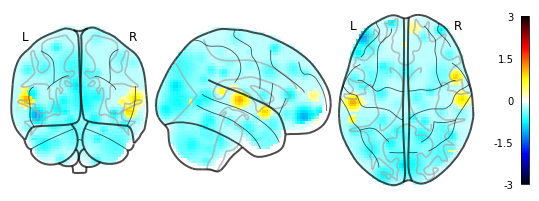

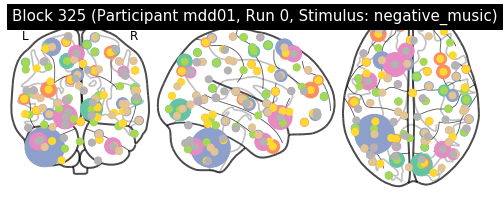

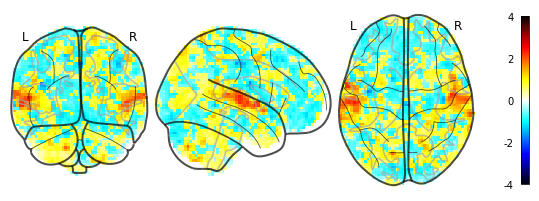

01/31/2020 11:59:50 Reconstruction Error (Frobenius Norm): 8.85765320e+02 out of 8.95499817e+02


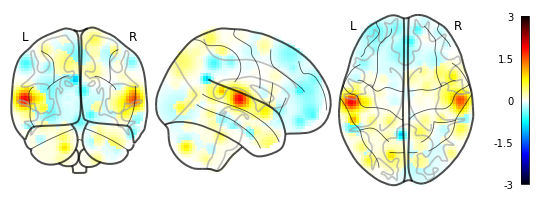

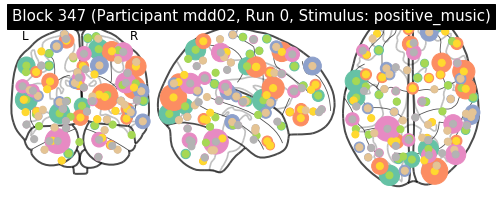

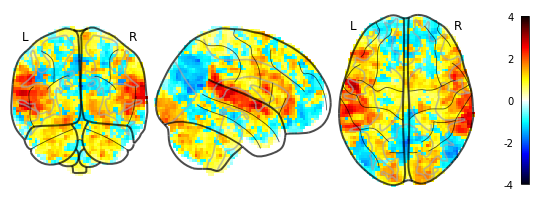

01/31/2020 11:59:54 Reconstruction Error (Frobenius Norm): 9.14206360e+02 out of 9.67287537e+02


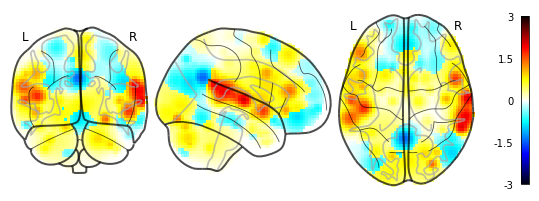

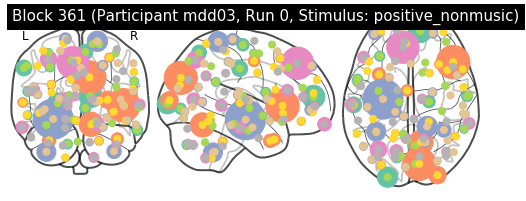

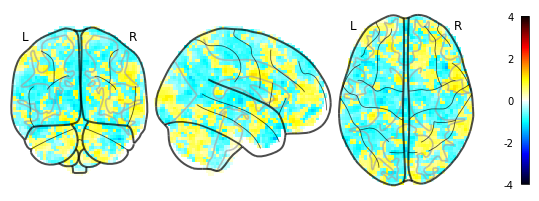

01/31/2020 11:59:57 Reconstruction Error (Frobenius Norm): 8.76627930e+02 out of 8.82675720e+02


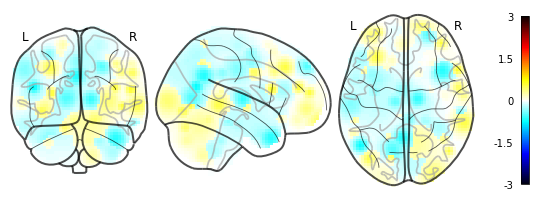

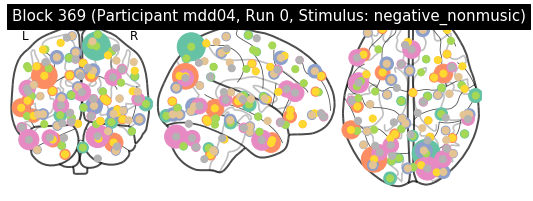

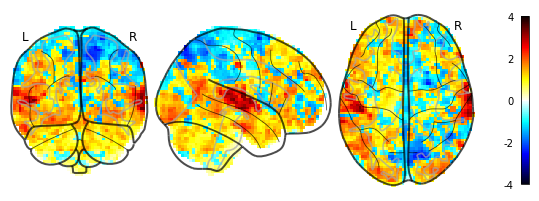

01/31/2020 12:00:02 Reconstruction Error (Frobenius Norm): 9.58624695e+02 out of 1.01888086e+03


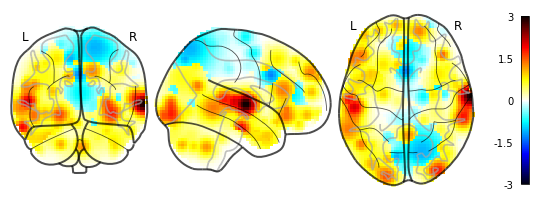

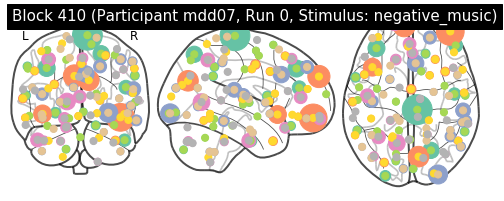

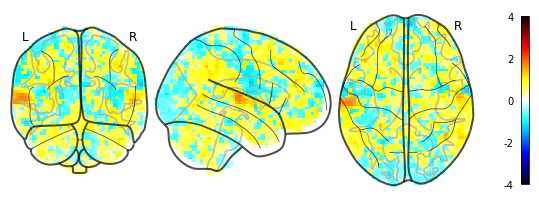

01/31/2020 12:00:05 Reconstruction Error (Frobenius Norm): 8.39016785e+02 out of 8.46869873e+02


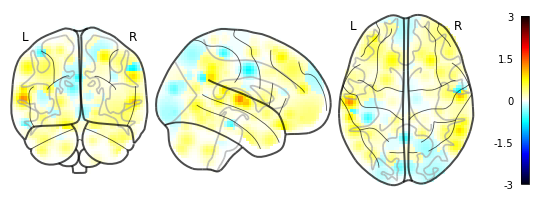

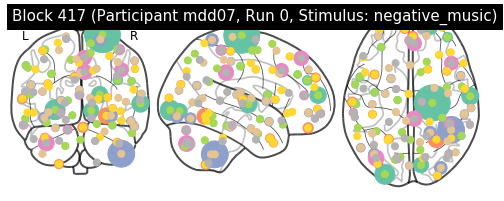

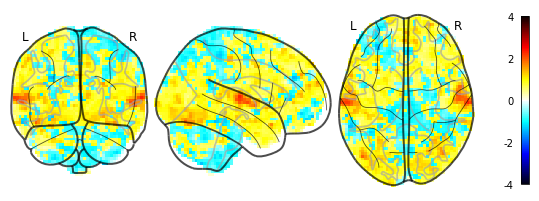

01/31/2020 12:00:09 Reconstruction Error (Frobenius Norm): 8.23251282e+02 out of 8.45543823e+02


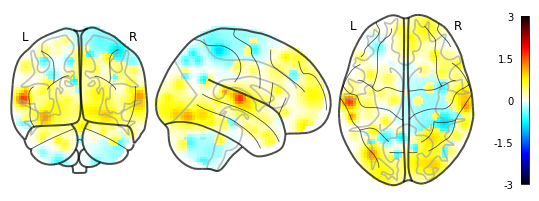

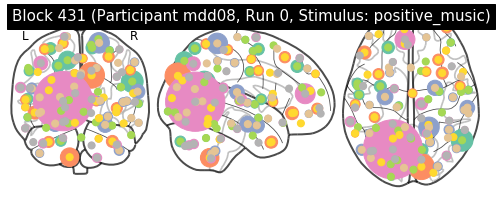

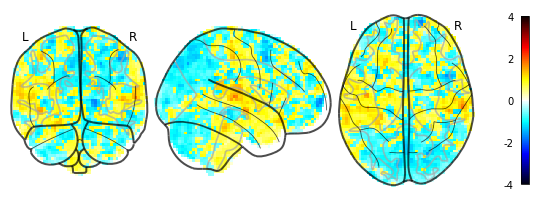

01/31/2020 12:00:13 Reconstruction Error (Frobenius Norm): 8.86292480e+02 out of 8.99290405e+02


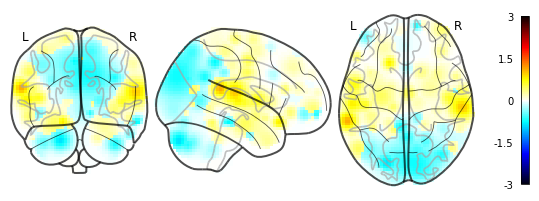

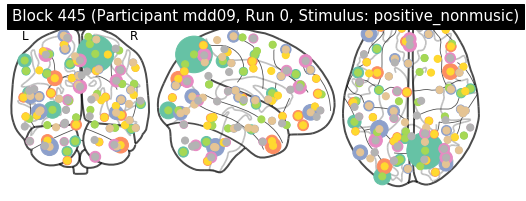

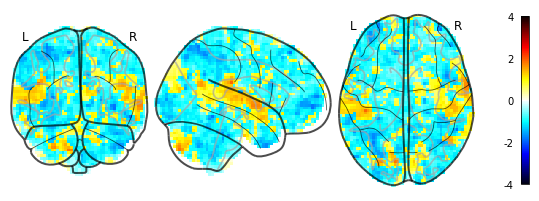

01/31/2020 12:00:17 Reconstruction Error (Frobenius Norm): 9.32706238e+02 out of 9.54931152e+02


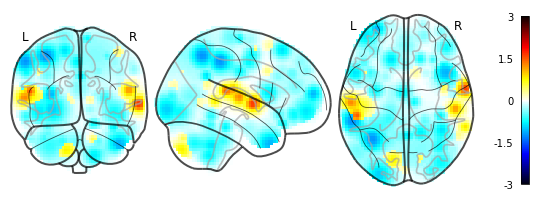

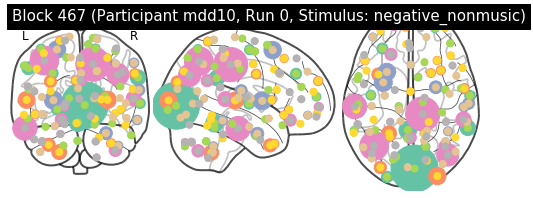

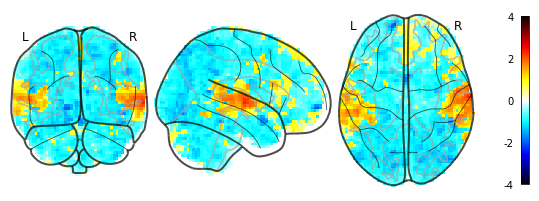

01/31/2020 12:00:21 Reconstruction Error (Frobenius Norm): 7.97604248e+02 out of 8.51223450e+02


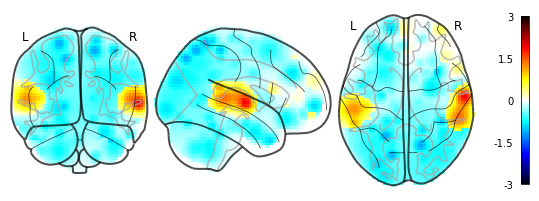

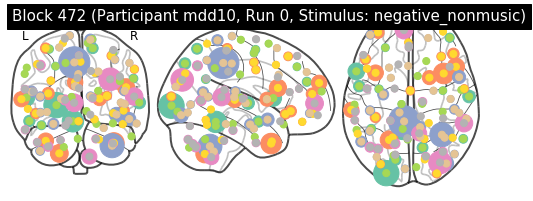

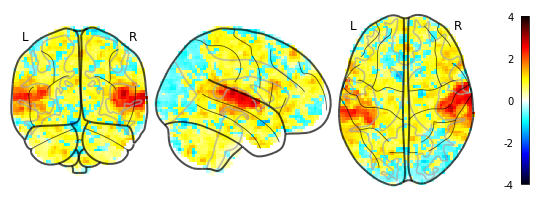

01/31/2020 12:00:24 Reconstruction Error (Frobenius Norm): 8.46769958e+02 out of 8.85499268e+02


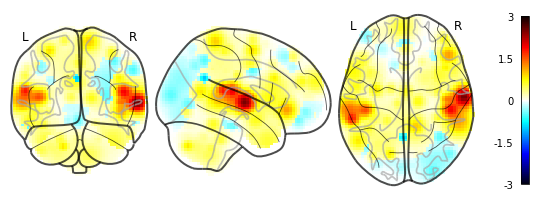

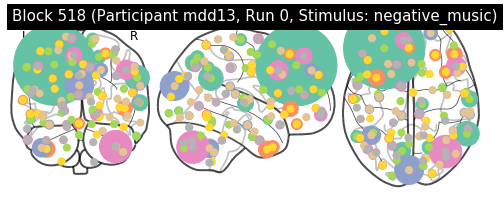

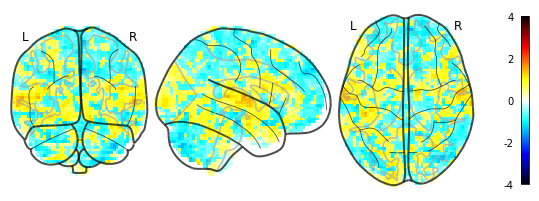

01/31/2020 12:00:28 Reconstruction Error (Frobenius Norm): 8.76628052e+02 out of 8.83407654e+02


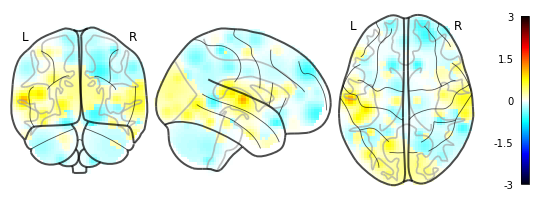

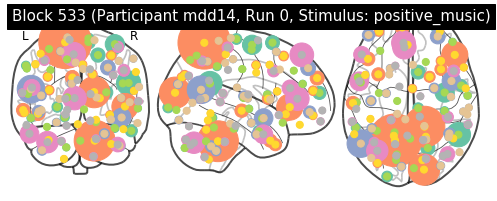

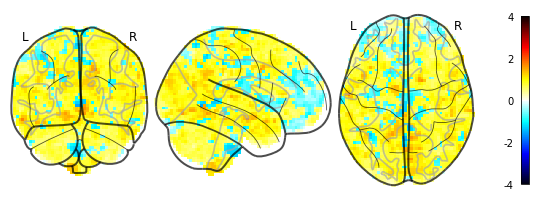

01/31/2020 12:00:32 Reconstruction Error (Frobenius Norm): 8.80137390e+02 out of 9.08449036e+02


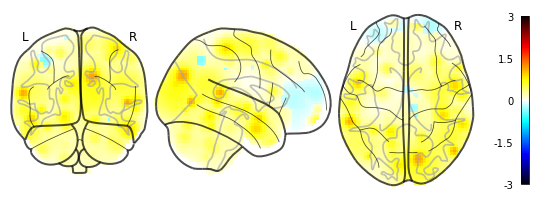

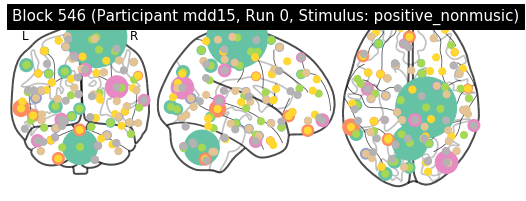

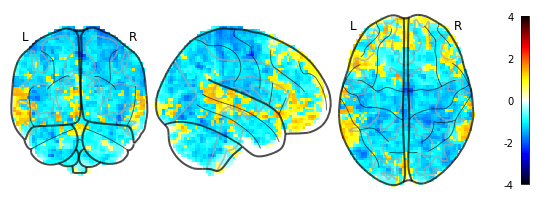

01/31/2020 12:00:36 Reconstruction Error (Frobenius Norm): 8.80480530e+02 out of 9.35163940e+02


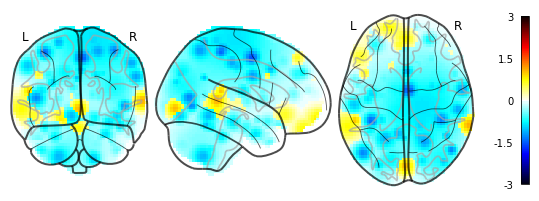

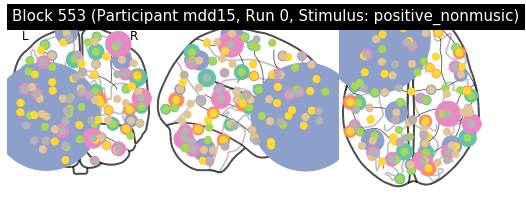

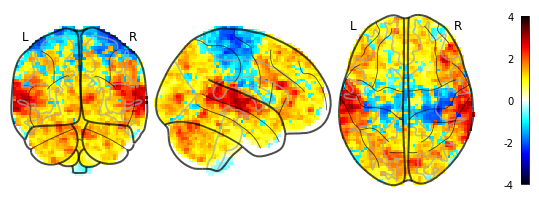

01/31/2020 12:00:40 Reconstruction Error (Frobenius Norm): 9.21917175e+02 out of 1.01635852e+03


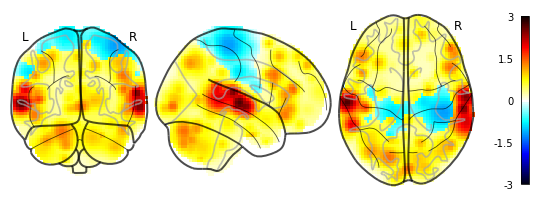

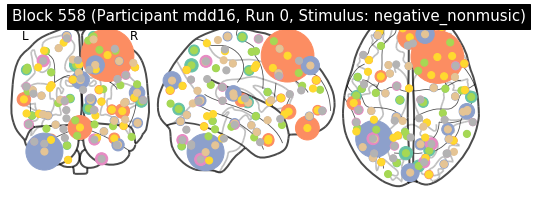

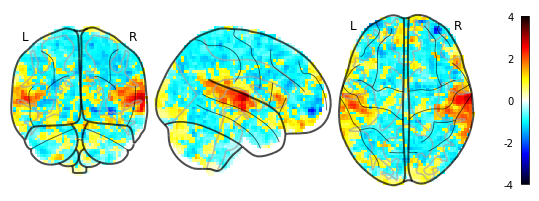

01/31/2020 12:00:44 Reconstruction Error (Frobenius Norm): 8.57887756e+02 out of 8.84148621e+02


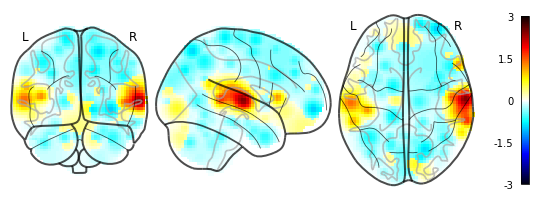

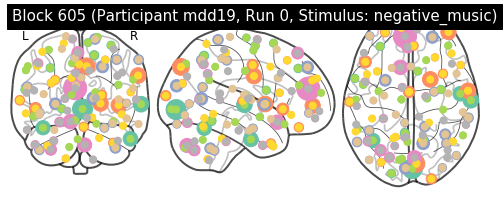

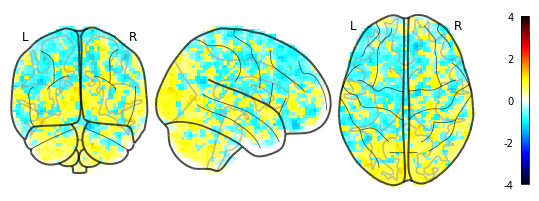

01/31/2020 12:00:48 Reconstruction Error (Frobenius Norm): 9.29787048e+02 out of 9.34860962e+02


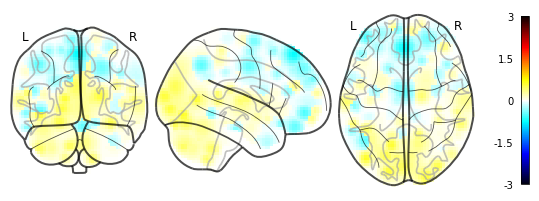

In [14]:
for index in validation_blocks[0:-1:3]:
    htfa.plot_factor_centers(index)
    htfa.plot_original_brain(index, labeler=lambda b: None, t=None, zscore_bound=4.)
    htfa.plot_reconstruction(index, labeler=lambda b: None, t=None)

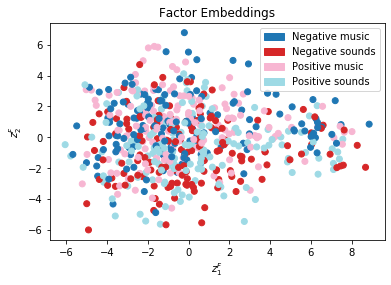

In [15]:
#factor 'embeddings' with PCA
htfa.scatter_factor_embedding(labeler=task_labeler, embedding='PCA')

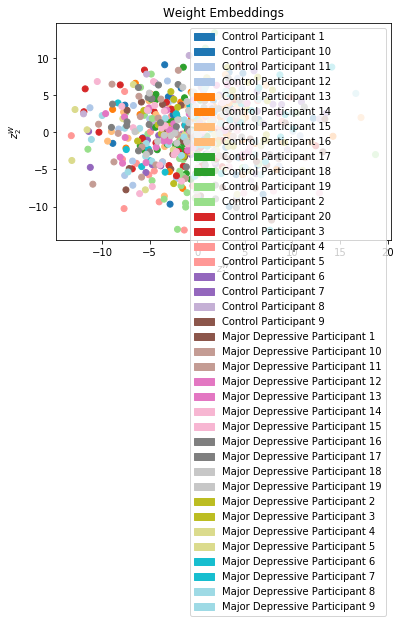

In [16]:
#weight 'embeddings' with PCA
htfa.scatter_weight_embedding(labeler=subject_labeler, embedding='PCA')

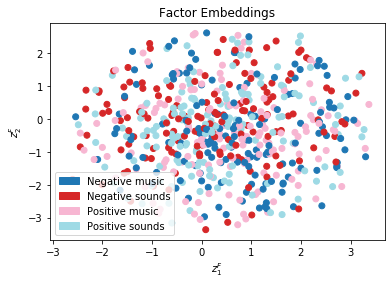

In [17]:
#factor 'embeddings' with TSNE
htfa.scatter_factor_embedding(labeler=task_labeler, embedding='TSNE')

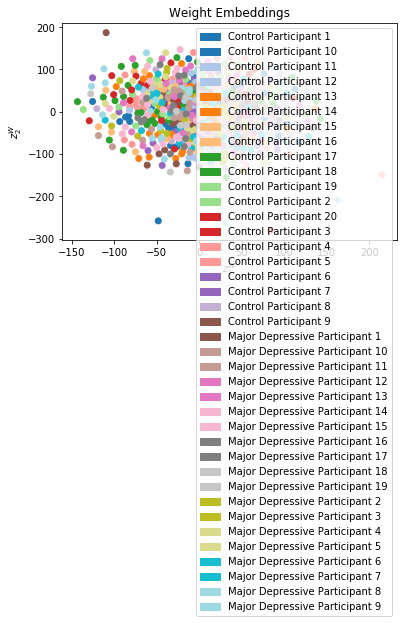

In [18]:
#weight 'embeddings' with TSNE
htfa.scatter_weight_embedding(labeler=subject_labeler, embedding='TSNE')

In [19]:
htfa.average_reconstruction_error(weighted=False)

01/31/2020 12:01:37 Average reconstruction error (MSE): 7.92849001e+02 +/- 4.81738288e+01
01/31/2020 12:01:37 Average data norm (Euclidean): 9.09370241e+02 +/- 5.44358225e+01
01/31/2020 12:01:37 Percent average reconstruction error: 87.298135 +/- 4.52726121e+00


(array([817.38983154, 795.56774902, 732.23248291, 815.91027832,
        760.99475098, 782.04870605, 813.82281494, 789.46594238,
        714.76641846, 714.50915527, 733.78991699, 718.17218018,
        760.51800537, 808.0491333 , 778.42980957, 762.19708252,
        741.8772583 , 772.53417969, 756.44110107, 771.68280029,
        813.91821289, 829.22485352, 839.45941162, 826.91143799,
        791.64904785, 815.63787842, 805.78875732, 788.38580322,
        768.99530029, 839.39703369, 790.83197021, 821.21630859,
        757.66906738, 775.84161377, 770.45153809, 758.42260742,
        729.29492188, 728.98406982, 725.50024414, 693.99047852,
        800.57922363, 764.26269531, 799.09442139, 834.2878418 ,
        810.09484863, 800.63769531, 820.59265137, 820.42785645,
        814.30255127, 808.980896  , 817.13433838, 792.40899658,
        819.94598389, 836.80664062, 840.08520508, 854.77612305,
        836.53265381, 869.58239746, 835.93707275, 848.89959717,
        813.06018066, 828.43890381, 783.

In [20]:
def condition_labeler(block):
    subject_regex = re.compile("([A-Za-z]+)([0-9]{1,2})")
    m = subject_regex.search(block.subject)
    condition, sub_num = m.groups()
    if condition == 'mdd':
        return 'Major Depressive'
    elif condition == 'control':
        return 'Control'
    return condition

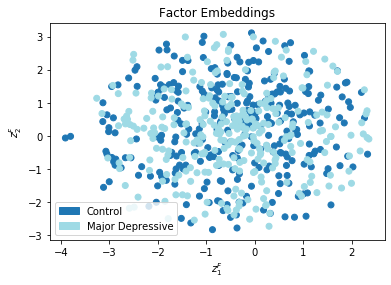

In [21]:
htfa.scatter_factor_embedding(labeler=condition_labeler, embedding='TSNE')

In [22]:
htfa.free_energy(batch_size=50, use_cuda=True, blocks_batch_size=12, sample_size=100,
                 blocks_filter=lepping_db.inference_filter(training=True))

[[548970112.0, -539194112.0, 9776056.0],
 [549059008.0, -539076416.0, 9778465.0]]

In [23]:
htfa.free_energy(batch_size=50, use_cuda=True, blocks_batch_size=12, sample_size=100,
                 blocks_filter=lepping_db.inference_filter(training=False))

[[110349208.0, -108713872.0, 1635323.375],
 [110548120.0, -108604576.0, 1636385.875]]